# Tempo estimation and beat tracking  

### George Tzanetakis, University of Victoria 

In this notebook we will explore the basic concepts behind tempo estimation and beat tracking. 


In [7]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as signal 
from scipy.interpolate import interp1d 
import IPython.display as ipd

Let's also load an audio recording

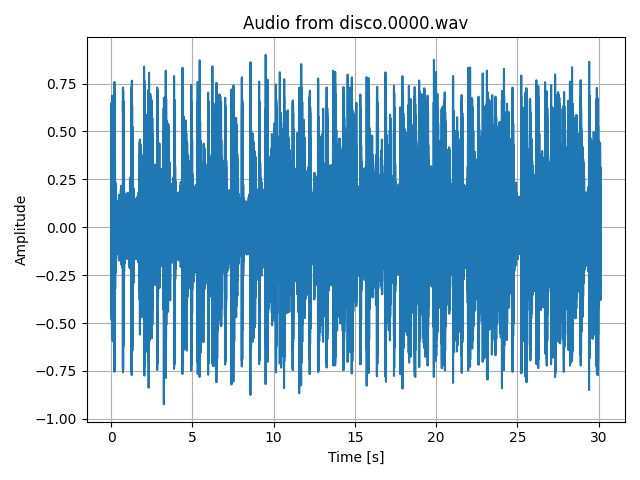

In [8]:
import scipy.io.wavfile as wav
srate, audio_signal = wav.read("disco\\disco.00000.wav")
# scale to -1.0/1.0 
audio = audio_signal.astype(np.float32) / 32767.0 
# make max be 0.9 
audio = (0.9 / max(audio)) * audio
t = np.arange(len(audio)) / srate

plt.figure()
plt.title('Audio from disco.0000.wav')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.plot(t, audio)
plt.grid()
plt.tight_layout()
plt.show()

In [9]:
ipd.Audio(audio,rate=srate)

Now that we have seen how we can estimate the pitch of a single frame of audio 
we can abstract this process into functions and then write a function that 
given an audio signal returns the associated pitch track and amplitude track (RMS) 
using a particular pitch extraction method. 

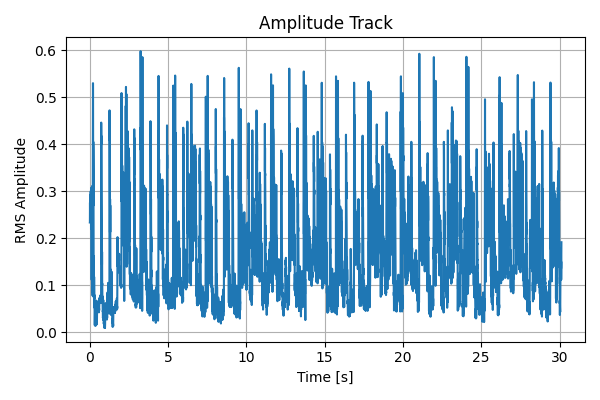

In [10]:
def rms_track(data, hopSize, winSize): 
    offsets = np.arange(0, len(data), hopSize)
    rms_track = np.zeros(len(offsets))
    
    for (m,o) in enumerate(offsets): 
        frame = data[o:o+winSize] 
        rms_track[m] = np.sqrt(np.mean(np.square(frame)))  
    return (rms_track)
    
# compute the rms track 
hopSize = 128 
winSize = 256
at = rms_track(audio, hopSize, winSize)
t = np.linspace(0, len(audio)/srate, len(at))
plt.figure(figsize=(6,4)) 
plt.title('Amplitude Track')
plt.plot(t, at)
plt.xlabel('Time [s]')
plt.ylabel('RMS Amplitude')
plt.grid()
plt.tight_layout()
plt.show()

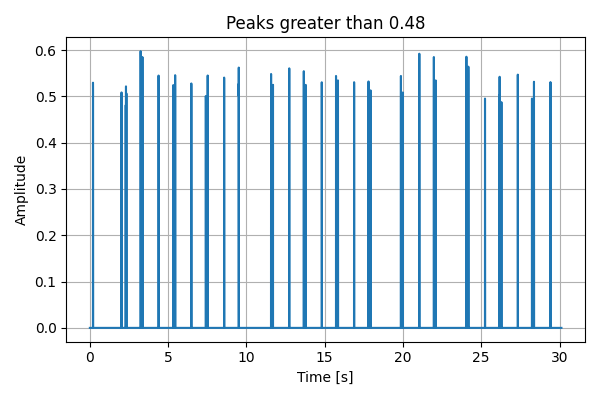

In [11]:
# Discard ampltiude unless greater than 0.4
th = 0.48
peaks = np.where(at<th, 0, at)
plt.figure(figsize=(6,4)) 
plt.title('Peaks greater than ' + str(th))
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.plot(t, peaks)
plt.grid()
plt.tight_layout()
plt.show()

In [12]:
# Retrieve index of each peak
indices = np.nonzero(peaks)[0]
# difference between each peak
print(indices)

[   69    70   697   704   790   795   803   804  1117  1118  1156  1157
  1158  1511  1512  1513  1834  1835  1836  1877  1878  2232  2233  2234
  2550  2551  2552  2553  2592  2593  2594  2955  2956  3274  3275  3276
  3277  3278  3987  3988  3989  4030  4387  4388  4707  4708  4750  4751
  5103  5104  5417  5418  5459  5460  5814  5815  5816  6132  6176  6177
  6845  6888  7249  7250  7251  7569  7570  7610  7611  8286  8287  8329
  8330  8695  8696  9012  9017  9057  9416  9417  9418  9729  9772  9773
 10136 10137]


In [13]:
period_in_frames = np.median(np.diff(indices))
print(period_in_frames)
period_in_samples = period_in_frames * hopSize
print(period_in_samples)

1.0
128.0


In [14]:
period_in_secs = period_in_samples / srate
print(period_in_samples / srate)

0.0029024943310657597


In [15]:
bpm = 60.0 / period_in_secs 
print("Tempo estimate (BPM): %2.2f" %  bpm)

Tempo estimate (BPM): 20671.88


In [16]:
def sonify_onsets(audio, hopSize, winSize, indices): 
    k = 1 
    offsets = np.arange(0, len(audio), hopSize)
    # noise burst 
    noise = np.random.normal(0, 1.0, winSize)
    noise *= np.hanning(winSize)
    # output signal FIXED to work with any hop or win size
    osignal = np.zeros(offsets[-1]+winSize)
    diff = len(osignal) - len(audio)
    audio = np.pad(audio, (0, diff))
    for (m,o) in enumerate(offsets): 
        iframe = audio[o:o+winSize] 
        oframe = 0.4 * iframe 


        # replace frame with noise if the frame corresponds to an onset  
        if ((k < len(indices)) and (m == indices[k:][0])): 
            k += 1
            osignal[o:o+winSize] += noise
        else: 
            osignal[o:o+winSize] += oframe 
    return osignal 

osignal = sonify_onsets(audio, hopSize, winSize, indices)
ipd.Audio(osignal,rate=srate)

In [17]:
tempo_onset = indices[0]
tempo_indices = [tempo_onset] 
while tempo_onset * hopSize < len(audio): 
    tempo_onset = tempo_onset + period_in_frames
    tempo_indices.append(tempo_onset)
print(tempo_indices)

osignal = sonify_onsets(audio, hopSize, winSize, tempo_indices)
ipd.Audio(osignal,rate=srate)

[69, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 180.0, 181.0, 182.0, 183.0, 184.0, 185.0, 186.0, 187.0, 188.0, 189.0, 190.0, 191.0, 192.0, 193.0, 194.0, 195.0, 196.0, 197.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0, 204.0, 205.0, 206.0, 207.0, 208.0, 209.0, 210.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216

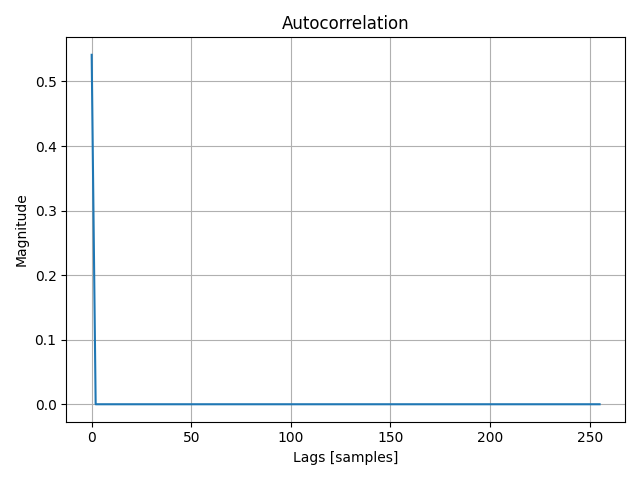

70.0
Tempo estimate (BPM): 295.31


In [18]:
peak = peaks[0:(winSize)]
acr = np.correlate(peak, peak, mode='full')
acr = acr[int(len(acr)/2):]
plt.figure()
plt.title('Autocorrelation')
plt.xlabel('Lags [samples]')
plt.ylabel('Magnitude')
plt.plot(acr)
plt.grid()
plt.tight_layout()
plt.show()
acr_peak_location = np.argmax(acr[70:])+70

bpm = 60.0 * (float(srate) / (acr_peak_location * hopSize))
period_in_frames = 60.0 * srate / bpm / hopSize
print(period_in_frames)
print("Tempo estimate (BPM): %2.2f" %  bpm)

In [19]:
tempo_onset = indices[0]
tempo_indices = [tempo_onset] 
while tempo_onset * hopSize < len(audio): 
    tempo_onset = tempo_onset + period_in_frames
    tempo_indices.append(tempo_onset)
print(tempo_indices)

osignal = sonify_onsets(audio, hopSize, winSize, tempo_indices)
ipd.Audio(osignal,rate=srate)

[69, 139.0, 209.0, 279.0, 349.0, 419.0, 489.0, 559.0, 629.0, 699.0, 769.0, 839.0, 909.0, 979.0, 1049.0, 1119.0, 1189.0, 1259.0, 1329.0, 1399.0, 1469.0, 1539.0, 1609.0, 1679.0, 1749.0, 1819.0, 1889.0, 1959.0, 2029.0, 2099.0, 2169.0, 2239.0, 2309.0, 2379.0, 2449.0, 2519.0, 2589.0, 2659.0, 2729.0, 2799.0, 2869.0, 2939.0, 3009.0, 3079.0, 3149.0, 3219.0, 3289.0, 3359.0, 3429.0, 3499.0, 3569.0, 3639.0, 3709.0, 3779.0, 3849.0, 3919.0, 3989.0, 4059.0, 4129.0, 4199.0, 4269.0, 4339.0, 4409.0, 4479.0, 4549.0, 4619.0, 4689.0, 4759.0, 4829.0, 4899.0, 4969.0, 5039.0, 5109.0, 5179.0, 5249.0, 5319.0, 5389.0, 5459.0, 5529.0, 5599.0, 5669.0, 5739.0, 5809.0, 5879.0, 5949.0, 6019.0, 6089.0, 6159.0, 6229.0, 6299.0, 6369.0, 6439.0, 6509.0, 6579.0, 6649.0, 6719.0, 6789.0, 6859.0, 6929.0, 6999.0, 7069.0, 7139.0, 7209.0, 7279.0, 7349.0, 7419.0, 7489.0, 7559.0, 7629.0, 7699.0, 7769.0, 7839.0, 7909.0, 7979.0, 8049.0, 8119.0, 8189.0, 8259.0, 8329.0, 8399.0, 8469.0, 8539.0, 8609.0, 8679.0, 8749.0, 8819.0, 8889.0, 

In [20]:
nbeats = 8 

avg_bar = np.zeros(44 * nbeats * hopSize)

for (n,t) in enumerate(tempo_indices[0::nbeats]): 
    bar = audio[int(t) * hopSize: int(t)* hopSize + 44 * nbeats * hopSize]
    if (n < len(tempo_indices[0::nbeats])-1):
        avg_bar += bar
ipd.Audio(avg_bar,rate=srate)

## Calculate Spectral Flux ##
Formula taken from:
* https://fr.mathworks.com/help/audio/ref/spectralflux.html#d126e25012

In [21]:
def spectralFlux(audio, hopSize, winSize, normType=2):
    # index for each hop
    startIndex = np.arange(0, len(audio), hopSize)
    # Pad signal to match size of hop & window
    padLen = startIndex[-1] + winSize - len(audio)
    padAudio = np.pad(audio, (0, padLen))
    # array to store all ffts
    fft = np.zeros((len(startIndex), winSize), dtype='complex')
    # array to store spectral flux
    SF = np.zeros(len(startIndex))

    for (m,o) in enumerate(startIndex):
        # apply fft to curret hop + window
        fft[m,:] = np.fft.fft( padAudio[o:o+winSize] )
        # Spectral flux formula
        SF[m] = np.sum( np.abs( fft[m,:] - fft[m-1,:] )**normType )**(1/normType)
    
    return SF

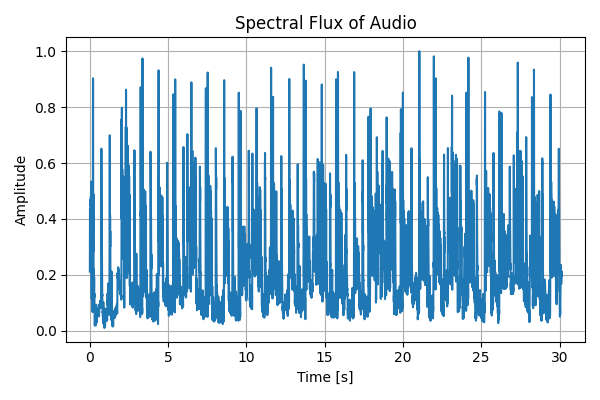

In [22]:
SF = spectralFlux(audio, hopSize, winSize, 2)
# normalize
SF = SF / np.max(SF)
t = np.linspace(0, len(audio)/srate, len(SF))
plt.figure(figsize=(6,4))
plt.title('Spectral Flux of Audio')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.plot(t, SF)
plt.grid()
plt.tight_layout()
plt.show()

Select peaks for approximating tempo

In [23]:
# Threshold for selecting peaks
th = 0.54
peaks = np.where(SF<th, 0, SF)
indices = np.nonzero(peaks)[0]
# Sinal with onset features chosen
osignal = sonify_onsets(audio, hopSize, winSize, indices)
indices = np.diff(indices)
ipd.Audio(osignal,rate=srate)

Estimate tempo:

In [24]:
period_in_frames = np.median(indices)
period_in_samples = period_in_frames * hopSize
period_in_secs = period_in_samples / srate
bpm = 60.0 / period_in_secs 
print("Tempo estimate (BPM): %2.2f" %  bpm)

Tempo estimate (BPM): 20671.88


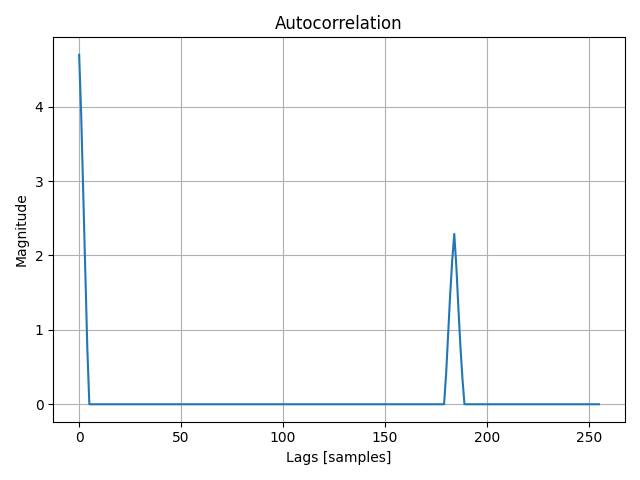

184
Tempo estimate (BPM): 112.35


In [25]:
peak = peaks[:winSize]
acr = np.correlate(peak, peak, mode='full')
acr = acr[int(len(acr)/2):]
plt.figure()
plt.title('Autocorrelation')
plt.xlabel('Lags [samples]')
plt.ylabel('Magnitude')
plt.grid()
plt.plot(acr)
plt.tight_layout()
plt.show()
acr_peak_location = np.argmax(acr[10:])+10
print(acr_peak_location)
bpm = 60.0 * (float(srate) / (acr_peak_location * hopSize))
print("Tempo estimate (BPM): %2.2f" %  bpm)

## Beat tracking of all disco samples ##
I could not retrieve the tempo dataset as the link given is to a website that was not working. So I retrieved the BPM of each disco sample by using Fl Studio 21.2 and I wrote it in a text document.

In [26]:
bpmList = np.loadtxt('disco/Measured BPM.txt', delimiter=",")
print(bpmList)

[115.22  116.876 114.59  126.068 120.936 108.254 106.952 129.284 105.378
 129.164 106.952 125.862 112.31   90.187 103.612 121.442 122.434 123.586
 123.922 117.364 106.606 109.774 120.162 114.462 127.77  124.152 120.464
 111.198 121.84  104.976 136.18  123.772 110.054 102.238 130.044 121.584
 135.824 130.59  123.294 110.446 138.074 106.588 105.392 127.814 123.23
 122.778 120.42  144.264 101.314 119.452 109.916 109.938 125.576 139.332
 114.158 129.932  88.17  118.214 131.594 125.204 129.484 125.826 109.242
 130.518 122.716 130.882 133.29  100.674 106.24  107.406 109.836 113.588
 136.578 113.986 111.754 132.416 127.634 117.132 128.46  121.004  98.007
 104.19  123.146 116.862 114.562 123.694 126.08  104.626 124.164 129.964
 128.324 100.078 114.948 109.57  138.38  121.086 102.38  130.362 122.286
 122.286]


In [40]:
hopSize = 256
winSize = 512
th = 0.5

def medianEstimate(amp_track, threshold, hopSize, srate):
    peaks = np.where(amp_track<threshold, 0, amp_track)
    indices = np.diff(np.nonzero(peaks)[0])
    # purge very low numbers (they are noise)
    # This reduces the upper limit of tempo estimation
    # but to reasonable numbers
    #indices = np.where(indices<=6, 0, indices)
    #indices = indices[indices != 0]
    # Estimate bpm with indices
    bpm = 60.0 * float(srate) / (np.median(indices) * hopSize)
    return bpm

def acrEstimate(amp_track, threshold, hopSize, srate):
    peaks = np.where(amp_track<threshold, 0, amp_track)
    peak = peaks[:(hopSize*2)]
    acr = np.correlate(peak, peak, mode='full')
    acr = acr[int(len(acr)/2):]
    acr_peak_location = np.argmax(acr[50:])+50 # Reduce noise by removing first lags
    bpm = 60.0 * (float(srate) / (acr_peak_location * hopSize))
    return bpm

# Start estimating BPM of all files
bpm = np.zeros((4, len(bpmList)))
results = np.zeros_like(bpm)

def checkResults(bpm, bpmRef):
    if(bpm >= (bpmRef-4) and bpm <= (bpmRef+4)):
        y = True
    else:
        y = False
    return y


for (n, bpmRef) in enumerate(bpmList):
    # Read sample
    if n < 10:
        fs, audio = wav.read('disco/disco.0000' + str(n) + '.wav')
    else:
        fs, audio = wav.read('disco/disco.000' + str(n) + '.wav')
    # scale to -1.0/1.0 
    sample = audio.astype(np.float32) / 32767.0 
    # make max be 0.9 
    sample = sample / np.max( np.abs(sample) ) * 0.9
    
    # Estimate bpm using RMS & Median
    at = rms_track(sample, hopSize, winSize)
    bpm[0,n] = medianEstimate(at, th, hopSize, fs)
    # Estimate bpm using RMS & ACR
    bpm[1,n] = acrEstimate(at, th, hopSize, fs)
    # Estimate bpm using SF & Median
    at = spectralFlux(sample, hopSize, winSize, 2)
    bpm[2,n] = medianEstimate(at, th, hopSize, fs)
    # Estimate bpm using SF & ACR
    bpm[3,n] = acrEstimate(at, th, hopSize, fs)

    # check results
    results[0,n] = checkResults(bpm[0,n], bpmRef)
    results[1,n] = checkResults(bpm[1,n], bpmRef)
    results[2,n] = checkResults(bpm[2,n], bpmRef)
    results[3,n] = checkResults(bpm[3,n], bpmRef)


c:\Users\garam\OneDrive\Documentos\PyEnv\cmlenv\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\garam\OneDrive\Documentos\PyEnv\cmlenv\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


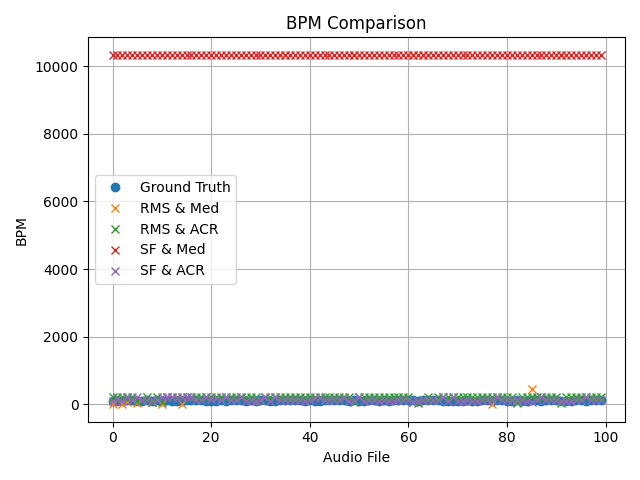

In [41]:
plt.figure()
plt.title('BPM Comparison')
plt.xlabel('Audio File')
plt.ylabel('BPM')
plt.plot(bpmList, label='Ground Truth', linestyle='None', marker='o')
plt.plot(bpm[0,:], label='RMS & Med', linestyle='None', marker='x')
plt.plot(bpm[1,:], label='RMS & ACR', linestyle='None', marker='x')
plt.plot(bpm[2,:], label='SF & Med', linestyle='None', marker='x')
plt.plot(bpm[3,:], label='SF & ACR', linestyle='None', marker='x')
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

Results of each algorithm, 1 indicates the bpm estimated is at most ±4 units from the ground truth, otherwise 0.

In [42]:
print('RMS&Med results: ' + str(results[0,:]))
print('RMS&ACR results: ' + str(results[1,:]))
print('SF&Med results: ' + str(results[2,:]))
print('SF&ACR results: ' + str(results[3,:]))

RMS&Med results: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
RMS&ACR results: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
SF&Med results: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
SF&ACR results: [1. 0. 1. 0. 1. 

The only algorithm that works well is the Spectral FL=lux with Autocorrelation. Some of the other algorithms tend to give a guess twice or half the expected value, others just outright don't work. I think all of them have the potential to work reliably but more post processing is needed to reduce noise, particularly after selecting the peaks using a threshold.